# 04. ExtensiÃ³n ligera de visiÃ³n por computador

Este notebook amplÃ­a el TFM al dominio visual con una estrategia sencilla y defendible: reutilizar un modelo preentrenado, congelar casi todas sus capas y afinar solo la capa final con un dataset pequeÃ±o de imÃ¡genes.

La idea no es construir otro proyecto distinto ni competir con arquitecturas complejas. La idea es comprobar si el conocimiento visual aprendido previamente por un modelo generalista puede adaptarse a categorÃ­as coherentes con las usadas en el sistema textual del TFM:

- `playa`
- `coches`
- `cocina`
- `musica`
- `videojuegos`
- `viajes`
- `deporte`
- `animales`


## Relación con el resto del TFM

La lÃ³gica metodolÃ³gica es la misma que en la parte textual:

- en texto no se entrena un modelo lingÃ¼Ã­stico desde cero, sino que se reutiliza conocimiento semÃ¡ntico mediante `SentenceTransformers`;
- en visiÃ³n tampoco se entrena una red convolucional desde cero, sino que se reutiliza conocimiento visual ya aprendido con `transfer learning`.

Por tanto, esta extensiÃ³n visual debe leerse como una continuaciÃ³n natural del proyecto: se mantiene la idea de **reutilizar representaciones preaprendidas** y adaptarlas a un problema pequeÃ±o, con datos limitados y categorÃ­as parcialmente solapadas.

## Decisiones de diseño

- Se utiliza `ResNet18` preentrenado por su equilibrio entre sencillez, velocidad y facilidad de explicaciÃ³n.
- Se congelan todas las capas convolucionales y se sustituye Ãºnicamente la capa final.
- Se trabaja con `5-10` Ã©pocas para evitar entrenamiento pesado.
- Se incluye aumento de datos ligero para reducir un poco el sobreajuste sin deformar demasiado las imÃ¡genes.

Si este notebook falla al importar `torchvision`, instala antes las dependencias visuales mÃ­nimas, por ejemplo:

```bash
pip install torchvision pillow
```


In [73]:
from pathlib import Path
from collections import Counter
import copy
import json
import random
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import torch
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    classification_report,
    confusion_matrix,
)
from torch import nn
from torch.utils.data import DataLoader

try:
    from torchvision import datasets, models, transforms
    from torchvision.models import ResNet18_Weights
except ImportError as exc:
    raise ImportError(
        "Este notebook requiere torchvision. Instala la libreria con `pip install torchvision`."
    ) from exc


def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


SEED = 42
IMAGE_SIZE = 224
BATCH_SIZE = 16
EPOCHS = 10
LEARNING_RATE = 1e-3
NUM_WORKERS = 0
TOP_K_CATEGORIAS = 3
UMBRAL_CONFIANZA = 0.20

CATEGORIAS_OBJETIVO = [
    "animales",
    "coches",
    "cocina",
    "deporte",
    "musica",
    "playa",
    "viajes",
    "videojuegos",
]

DATASET_DIR = Path("data/images")

TRAIN_DIR = DATASET_DIR / "train"
TEST_DIR = DATASET_DIR / "test"

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
MODELO_GUARDADO = Path("models") / "vision_resnet18_head_only.pth"
MODELO_GUARDADO.parent.mkdir(parents=True, exist_ok=True)

set_seed(SEED)

print(f"Dispositivo disponible: {DEVICE}")
print(f"Ruta de dataset seleccionada: {DATASET_DIR.resolve()}")


Dispositivo disponible: cuda
Ruta de dataset seleccionada: C:\Users\rafae\Desktop\TFM2\data\images


## 1. Carga del dataset y preprocesamiento

El preprocesamiento sigue una lógica simple:

- `resize` a `224x224`, tamaño estÃ¡ndar para modelos preentrenados de ImageNet;
- normalización con la media y desviaciÃ³n tÃ­pica de ImageNet, para respetar el espacio de entrada esperado por el modelo;
- `data augmentation` ligero solo en entrenamiento, con flips, rotaciones suaves y un pequeño zoom.

Con un dataset de apenas `50-100` imágenes por clase, estas transformaciones no eliminan el riesgo de sobreajuste, pero só­ ayudan a que la ítima capa vea pequeÃ±as variaciones del mismo contenido.
            


In [74]:
class ImageFolderWithPaths(datasets.ImageFolder):
    def __getitem__(self, index):
        image, target = super().__getitem__(index)
        path, _ = self.samples[index]
        return image, target, path


def validar_estructura_dataset(dataset_dir: Path, categorias_esperadas):
    splits = ["train", "test"]

    if not dataset_dir.exists():
        raise FileNotFoundError(
            f"No se encontro el dataset en {dataset_dir.resolve()}. "
            "Crea la carpeta `dataset_imagenes/` o `data/dataset_imagenes/` con los splits train/test."
        )

    for split in splits:
        split_dir = dataset_dir / split
        if not split_dir.exists():
            raise FileNotFoundError(f"Falta la carpeta del split `{split}` en {split_dir.resolve()}.")

        categorias_presentes = {
            path.name for path in split_dir.iterdir() if path.is_dir()
        }
        faltantes = sorted(set(categorias_esperadas) - categorias_presentes)

        if faltantes:
            raise ValueError(
                f"En el split `{split}` faltan categorias: {faltantes}. "
                f"Categorias encontradas: {sorted(categorias_presentes)}"
            )


validar_estructura_dataset(DATASET_DIR, CATEGORIAS_OBJETIVO)

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose(
    [
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=8),
        transforms.RandomAffine(degrees=0, scale=(0.95, 1.05)),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ]
)

eval_transform = transforms.Compose(
    [
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ]
)

train_dataset = ImageFolderWithPaths(DATASET_DIR / "train", transform=train_transform)
test_dataset = ImageFolderWithPaths(DATASET_DIR / "test", transform=eval_transform)

if train_dataset.classes != test_dataset.classes:
    raise ValueError(
        "Las clases no coinciden entre train y test. Revisa la estructura de carpetas."
    )

if set(train_dataset.classes) != set(CATEGORIAS_OBJETIVO):
    raise ValueError(
        f"Las clases encontradas {train_dataset.classes} no coinciden con las categorias esperadas {CATEGORIAS_OBJETIVO}."
    )

class_names = [categoria for categoria in CATEGORIAS_OBJETIVO if categoria in train_dataset.class_to_idx]

dataloaders = {
    "train": DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS),
    "test": DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS),
}

dataset_sizes = {
    "train": len(train_dataset),
    "test": len(test_dataset),
}


def contar_por_clase(dataset):
    conteo = Counter()
    for _, label in dataset.samples:
        conteo[dataset.classes[label]] += 1
    return conteo


conteos_df = pd.DataFrame(
    {
        split: pd.Series(contar_por_clase(dataset)).reindex(class_names)
        for split, dataset in {
            "train": train_dataset,
            "test": test_dataset,
        }.items()
    }
).fillna(0).astype(int)

display(conteos_df)
print("Tamanos por split:", dataset_sizes)
            


,train,test
animales,84,20
coches,84,18
cocina,84,18
deporte,88,18
musica,76,18
playa,85,18
viajes,84,18
videojuegos,84,18


Tamanos por split: {'train': 669, 'test': 146}


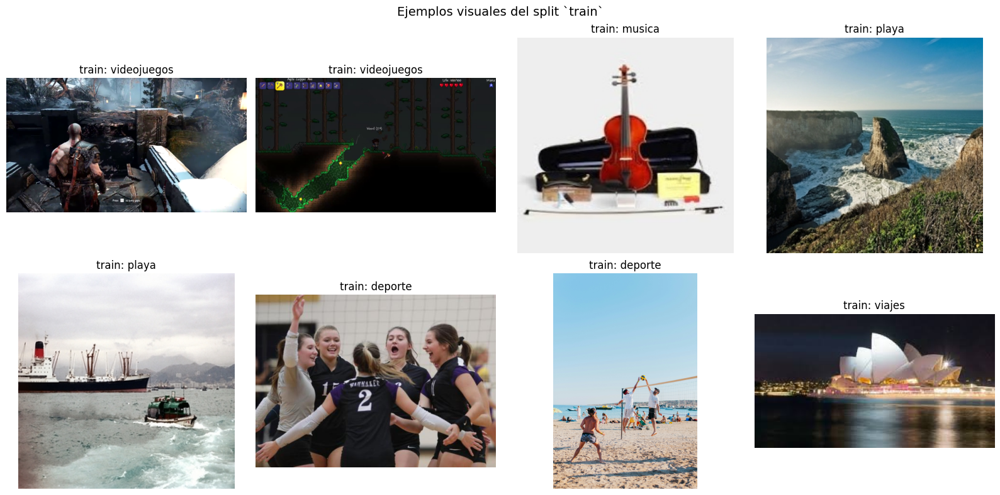

In [75]:
def mostrar_ejemplos_split(dataset, split_name="train", n=8, seed=SEED):
    rng = random.Random(seed)
    indices = list(range(len(dataset.samples)))
    rng.shuffle(indices)
    seleccion = indices[: min(n, len(indices))]

    cols = 4
    rows = int(np.ceil(len(seleccion) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, idx in zip(axes, seleccion):
        path, target = dataset.samples[idx]
        image = Image.open(path).convert("RGB")
        ax.imshow(image)
        ax.set_title(f"{split_name}: {dataset.classes[target]}")
        ax.axis("off")

    for ax in axes[len(seleccion):]:
        ax.axis("off")

    plt.suptitle(f"Ejemplos visuales del split `{split_name}`", fontsize=14)
    plt.tight_layout()
    plt.show()


mostrar_ejemplos_split(train_dataset, split_name="train", n=8)


## 2. Transfer learning ligero

En este contexto, **congelar capas** significa mantener fijos los pesos del extractor visual preentrenado. Es decir, durante el entrenamiento no se actualizan las capas convolucionales que ya aprendieron bordes, texturas, formas y patrones visuales generales.

DespuÃ©s se sustituye solo la Ãºltima capa clasificadora para adaptarla a nuestras `8` categorÃ­as.

Esta estrategia tiene varias ventajas frente a entrenar desde cero:

- necesita muchas menos imÃ¡genes;
- reduce tiempo de entrenamiento;
- disminuye el riesgo de aprender patrones espurios con un dataset pequeÃ±o;
- y es mÃ¡s fÃ¡cil de defender metodolÃ³gicamente en un TFM de alcance limitado.

AquÃ­ no buscamos aprender una representaciÃ³n visual completamente nueva, sino comprobar si una representaciÃ³n general reutilizada puede separar razonablemente categorÃ­as como `playa`, `coches` o `animales`, y dÃ³nde empiezan las confusiones en clases mÃ¡s ambiguas como `viajes`.


In [76]:
weights = ResNet18_Weights.DEFAULT


def crear_modelo_transfer():
    modelo = models.resnet18(weights=weights)

    for param in modelo.parameters():
        param.requires_grad = False

    num_features = modelo.fc.in_features
    modelo.fc = nn.Linear(num_features, len(class_names))
    return modelo.to(DEVICE)


model = crear_modelo_transfer()
base_state = copy.deepcopy(model.state_dict())

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=LEARNING_RATE)


def contar_parametros(modelo):
    total = sum(param.numel() for param in modelo.parameters())
    entrenables = sum(param.numel() for param in modelo.parameters() if param.requires_grad)
    return total, entrenables


total_params, trainable_params = contar_parametros(model)
porcentaje_entrenable = 100 * trainable_params / total_params

print(model.fc)
print(f"Parametros totales: {total_params:,}")
print(f"Parametros entrenables: {trainable_params:,} ({porcentaje_entrenable:.2f}%)")


Linear(in_features=512, out_features=8, bias=True)
Parametros totales: 11,180,616
Parametros entrenables: 4,104 (0.04%)


## 3. Entrenamiento breve

El entrenamiento se limita a unas pocas épocas. Esto no solo reduce coste computacional: también obliga a mantener el foco en una pregunta más realista para el TFM.

La pregunta no es si podemos exprimir al máximo el dataset con tuning intensivo, sino si una adaptación mí­nima del clasificador final permite obtener un rendimiento razonable y quÃ© errores aparecen cuando las clases son visualmente parecidas o conceptualmente cercanas.

Al tratarse de un fine-tuning muy ligero de una sola capa, aquí­ se entrena directamente sobre `train` y se reserva `test` para la comparaciÃ³n final. Si la `accuracy` de entrenamiento sube muy deprisa, conviene interpretar los resultados con cautela porque el dataset sigue siendo pequeÃ±o y el riesgo de sobreajuste no desaparece.
            


In [77]:
def ejecutar_epoca(modelo, loader, criterion, optimizer=None):
    entrenamiento = optimizer is not None
    modelo.train() if entrenamiento else modelo.eval()

    running_loss = 0.0
    running_corrects = 0
    total = 0

    for images, labels, _ in loader:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        if entrenamiento:
            optimizer.zero_grad()

        with torch.set_grad_enabled(entrenamiento):
            outputs = modelo(images)
            loss = criterion(outputs, labels)
            preds = outputs.argmax(dim=1)

            if entrenamiento:
                loss.backward()
                optimizer.step()

        batch_size = images.size(0)
        running_loss += loss.item() * batch_size
        running_corrects += (preds == labels).sum().item()
        total += batch_size

    epoch_loss = running_loss / total
    epoch_acc = running_corrects / total
    return epoch_loss, epoch_acc


history = {
    "epoch": [],
    "train_loss": [],
    "train_acc": [],
}

start_time = time.time()

for epoch in range(1, EPOCHS + 1):
    train_loss, train_acc = ejecutar_epoca(model, dataloaders["train"], criterion, optimizer)

    history["epoch"].append(epoch)
    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)

    print(
        f"Epoca {epoch:02d}/{EPOCHS} | "
        f"train_loss={train_loss:.4f} | train_acc={train_acc:.4f}"
    )

elapsed = time.time() - start_time
final_state = copy.deepcopy(model.state_dict())
model.load_state_dict(final_state)

torch.save(
    {
        "model_state_dict": final_state,
        "base_model_state_dict": base_state,
        "class_names": class_names,
        "history": history,
        "image_size": IMAGE_SIZE,
        "normalization": {
            "mean": IMAGENET_MEAN,
            "std": IMAGENET_STD,
        },
    },
    MODELO_GUARDADO,
)

history_df = pd.DataFrame(history)
print(f"Tiempo total de entrenamiento: {elapsed:.1f} segundos")
print(f"Modelo guardado en: {MODELO_GUARDADO.resolve()}")

display(history_df)
            


c:\Users\rafae\Desktop\TFM2\.venv\lib\site-packages\PIL\Image.py:1137: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoca 01/10 | train_loss=1.7354 | train_acc=0.3857
Epoca 02/10 | train_loss=0.8778 | train_acc=0.8042
Epoca 03/10 | train_loss=0.6566 | train_acc=0.8430
Epoca 04/10 | train_loss=0.5309 | train_acc=0.8744
Epoca 05/10 | train_loss=0.4135 | train_acc=0.9013
Epoca 06/10 | train_loss=0.3940 | train_acc=0.9043
Epoca 07/10 | train_loss=0.3330 | train_acc=0.9193
Epoca 08/10 | train_loss=0.3317 | train_acc=0.9297
Epoca 09/10 | train_loss=0.3228 | train_acc=0.9058
Epoca 10/10 | train_loss=0.2941 | train_acc=0.9268
Tiempo total de entrenamiento: 102.5 segundos
Modelo guardado en: C:\Users\rafae\Desktop\TFM2\models\vision_resnet18_head_only.pth


,epoch,train_loss,train_acc
0,1,1.735394,0.385650
1,2,0.877846,0.804185
2,3,0.656594,0.843049
3,4,0.530945,0.874439
4,5,0.413535,0.901345
5,6,0.393997,0.904335
6,7,0.333010,0.919283
7,8,0.331676,0.929746
8,9,0.322780,0.905830
9,10,0.294071,0.926756


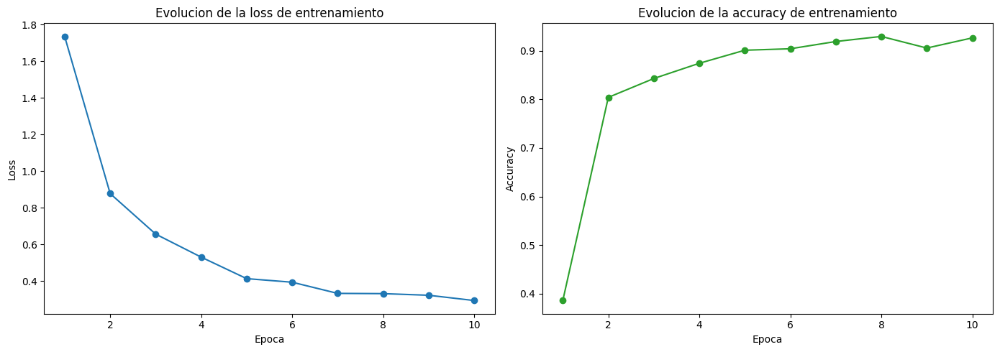

In [78]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_df["epoch"], history_df["train_loss"], marker="o", color="tab:blue")
axes[0].set_title("Evolucion de la loss de entrenamiento")
axes[0].set_xlabel("Epoca")
axes[0].set_ylabel("Loss")

axes[1].plot(history_df["epoch"], history_df["train_acc"], marker="o", color="tab:green")
axes[1].set_title("Evolucion de la accuracy de entrenamiento")
axes[1].set_xlabel("Epoca")
axes[1].set_ylabel("Accuracy")

plt.tight_layout()
plt.show()
            


## 4. Evaluacion comparada en test

La evaluacion final se organiza en cinco bloques complementarios:

1. `accuracy` global para comparar el punto de partida con el modelo adaptado al dominio.
2. matrices de confusion comparadas para ver que categorias mejoran y cuales siguen mezclandose.
3. ejemplos visuales lado a lado para comprobar que cambia realmente en las predicciones.
4. revision explicita de errores y casos ambiguos, sin ocultar limitaciones del enfoque.
5. tabla de cierre para resumir que aporta el `fine-tuning` ligero dentro del TFM.

La clave metodologica es sencilla: el modelo base aporta conocimiento visual general aprendido en `ImageNet`, mientras que el `fine-tuning` de la ultima capa ajusta la decision final a las categorias concretas del proyecto.


,Modelo,Accuracy,Error
0,Base,0.0822,0.9178
1,Fine-tuneado,0.8904,0.1096


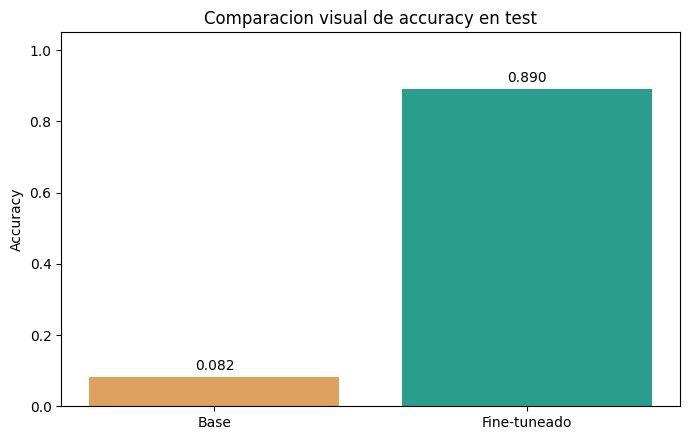

Lectura del accuracy comparado:
El modelo base reutiliza conocimiento visual general aprendido en ImageNet y, por eso, ya parte de una base razonable. Sin embargo, su ultima capa no conoce todavia las fronteras especificas del dominio del TFM. Tras afinar solo esa capa final, el sistema especializa la decision en categorias como playa, viajes, coches o animales. En este experimento la mejora es de 0.8082 puntos de accuracy, lo que refleja precisamente el valor del transfer learning: mantener el extractor visual general y adaptar la salida al problema concreto.


,precision_base,recall_base,f1_base,precision_fine_tuned,recall_fine_tuned,f1_fine_tuned,delta_f1
animales,0.000,0.000,0.000,1.000,0.950,0.974,0.974
coches,0.000,0.000,0.000,0.810,0.944,0.872,0.872
cocina,0.000,0.000,0.000,1.000,0.944,0.971,0.971
deporte,0.048,0.056,0.051,0.857,1.000,0.923,0.872
musica,0.094,0.167,0.120,0.857,1.000,0.923,0.803
playa,0.000,0.000,0.000,0.929,0.722,0.812,0.812
viajes,0.000,0.000,0.000,0.833,0.833,0.833,0.833
videojuegos,0.108,0.444,0.174,0.867,0.722,0.788,0.614


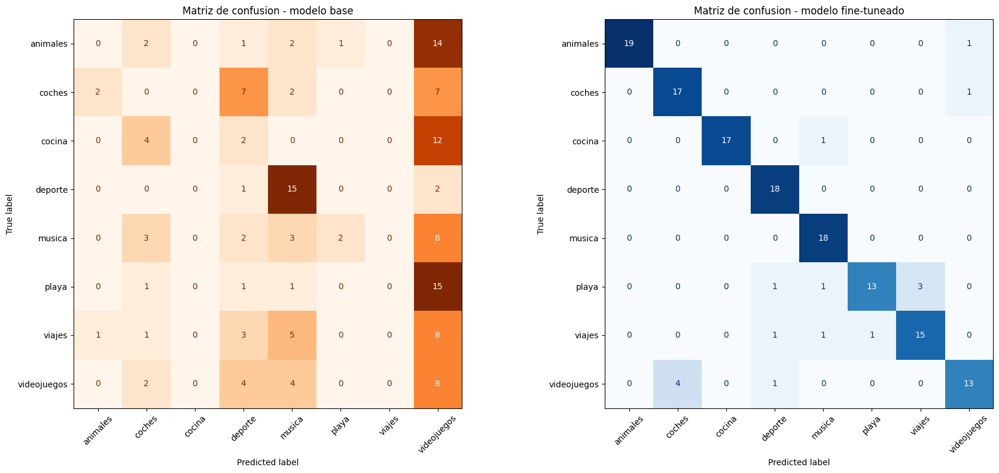

,ruta,clase_real,clase_predicha_base,confianza_base,clase_predicha_fine_tuned,confianza_fine_tuned,delta_confianza,mejora_fine_tuning
0,data\images\test\animales\4420b729-c6d7-496a-8...,animales,videojuegos,0.364,videojuegos,0.366,0.003,mantiene_error
1,data\images\test\animales\IMG-20260526-WA0040.jpg,animales,deporte,0.329,animales,0.651,0.322,corrige_error_base
2,data\images\test\animales\IMG-20260526-WA0041.jpg,animales,videojuegos,0.322,animales,0.538,0.217,corrige_error_base
3,data\images\test\animales\IMG-20260526-WA0042.jpg,animales,videojuegos,0.259,animales,0.979,0.720,corrige_error_base
4,data\images\test\animales\IMG-20260526-WA0043.jpg,animales,coches,0.272,animales,0.578,0.306,corrige_error_base
5,data\images\test\animales\dog-7956828_1280.jpg,animales,musica,0.258,animales,0.420,0.162,corrige_error_base
6,data\images\test\animales\dog1.jpg,animales,videojuegos,0.278,animales,0.959,0.681,corrige_error_base
7,data\images\test\animales\dog2.jpg,animales,videojuegos,0.227,animales,0.972,0.745,corrige_error_base


In [79]:
from textwrap import shorten

def construir_ranking_categorias(probabilidades, clases, top_k=TOP_K_CATEGORIAS, umbral=UMBRAL_CONFIANZA):
    top_k = min(top_k, len(clases))
    indices_ordenados = np.argsort(probabilidades)[::-1][:top_k]
    ranking = [
        {"categoria": clases[idx], "confianza": float(probabilidades[idx])}
        for idx in indices_ordenados
    ]
    categorias_filtradas = [item for item in ranking if item["confianza"] >= umbral]
    if not categorias_filtradas and ranking:
        categorias_filtradas = [ranking[0]]
    return ranking, categorias_filtradas


def formatear_ranking_categorias(ranking):
    return " | ".join(
        f"{item['categoria']} ({item['confianza']:.2f})"
        for item in ranking
    )


@torch.no_grad()
def predecir_dataset(modelo, dataset):
    loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    modelo.eval()
    filas = []

    for images, labels, paths in loader:
        images = images.to(DEVICE)
        outputs = modelo(images)
        probs = torch.softmax(outputs, dim=1)
        confs, preds = probs.max(dim=1)
        probs_cpu = probs.cpu().numpy()

        for path, label, pred, conf, prob_vector in zip(paths, labels.numpy(), preds.cpu().numpy(), confs.cpu().numpy(), probs_cpu):
            ranking_top_k, categorias_filtradas = construir_ranking_categorias(prob_vector, dataset.classes)
            filas.append(
                {
                    "ruta": path,
                    "clase_real": dataset.classes[label],
                    "clase_predicha": dataset.classes[pred],
                    "confianza": float(conf),
                    "top_k": ranking_top_k,
                    "top_k_resumen": formatear_ranking_categorias(ranking_top_k),
                    "categorias_confiables": [item["categoria"] for item in categorias_filtradas],
                    "categorias_confiables_resumen": formatear_ranking_categorias(categorias_filtradas),
                    "n_categorias_confiables": len(categorias_filtradas),
                    "vector_probabilidades": prob_vector.tolist(),
                    "probabilidades_por_categoria": {clase: float(prob_vector[idx]) for idx, clase in enumerate(dataset.classes)},
                    "acierto": bool(label == pred),
                }
            )

    return pd.DataFrame(filas)


def evaluar_modelo(nombre_modelo, modelo_eval, dataset):
    predicciones = predecir_dataset(modelo_eval, dataset)
    acc = accuracy_score(predicciones["clase_real"], predicciones["clase_predicha"])
    reporte = classification_report(
        predicciones["clase_real"],
        predicciones["clase_predicha"],
        labels=class_names,
        output_dict=True,
        zero_division=0,
    )
    cm_eval = confusion_matrix(
        predicciones["clase_real"],
        predicciones["clase_predicha"],
        labels=class_names,
    )
    return {
        "nombre": nombre_modelo,
        "accuracy": acc,
        "pred_df": predicciones,
        "report_df": pd.DataFrame(reporte).T,
        "cm": cm_eval,
    }


def construir_tabla_errores(cm_eval, nombre_modelo):
    filas = []
    for i, clase_real in enumerate(class_names):
        for j, clase_predicha in enumerate(class_names):
            if i == j:
                continue
            n_errores = int(cm_eval[i, j])
            if n_errores > 0:
                filas.append(
                    {
                        "modelo": nombre_modelo,
                        "clase_real": clase_real,
                        "clase_predicha": clase_predicha,
                        "n_errores": n_errores,
                    }
                )
    return pd.DataFrame(filas)


def interpretar_accuracy(acc_base, acc_fine_tuned):
    delta = acc_fine_tuned - acc_base
    tendencia = "mejora" if delta >= 0 else "caida"
    return (
        f"El modelo base reutiliza conocimiento visual general aprendido en ImageNet y, por eso, ya parte de una base razonable. "
        f"Sin embargo, su ultima capa no conoce todavia las fronteras especificas del dominio del TFM. Tras afinar solo esa capa final, "
        f"el sistema especializa la decision en categorias como playa, viajes, coches o animales. En este experimento la {tendencia} es de {delta:.4f} puntos de accuracy, "
        f"lo que refleja precisamente el valor del transfer learning: mantener el extractor visual general y adaptar la salida al problema concreto."
    )


modelo_base = crear_modelo_transfer()
modelo_base.load_state_dict(base_state)

modelo_fine_tuned = crear_modelo_transfer()
modelo_fine_tuned.load_state_dict(final_state)

resultados = {
    "base": evaluar_modelo("base", modelo_base, test_dataset),
    "fine_tuned": evaluar_modelo("fine_tuned", modelo_fine_tuned, test_dataset),
}

comparacion_accuracy = pd.DataFrame(
    [
        {"Modelo": "Base", "Accuracy": resultados["base"]["accuracy"]},
        {"Modelo": "Fine-tuneado", "Accuracy": resultados["fine_tuned"]["accuracy"]},
    ]
)
comparacion_accuracy["Error"] = 1 - comparacion_accuracy["Accuracy"]
display(comparacion_accuracy.style.format({"Accuracy": "{:.4f}", "Error": "{:.4f}"}))

fig, ax = plt.subplots(figsize=(7, 4.5))
colores = ["#DDA15E", "#2A9D8F"]
barras = ax.bar(comparacion_accuracy["Modelo"], comparacion_accuracy["Accuracy"], color=colores)
ax.set_ylim(0, 1.05)
ax.set_ylabel("Accuracy")
ax.set_title("Comparacion visual de accuracy en test")
for barra, valor in zip(barras, comparacion_accuracy["Accuracy"]):
    ax.text(barra.get_x() + barra.get_width() / 2, valor + 0.02, f"{valor:.3f}", ha="center")
plt.tight_layout()
plt.show()

print("Lectura del accuracy comparado:")
print(interpretar_accuracy(resultados["base"]["accuracy"], resultados["fine_tuned"]["accuracy"]))

comparacion_por_clase = pd.DataFrame(
    {
        "precision_base": resultados["base"]["report_df"].loc[class_names, "precision"],
        "recall_base": resultados["base"]["report_df"].loc[class_names, "recall"],
        "f1_base": resultados["base"]["report_df"].loc[class_names, "f1-score"],
        "precision_fine_tuned": resultados["fine_tuned"]["report_df"].loc[class_names, "precision"],
        "recall_fine_tuned": resultados["fine_tuned"]["report_df"].loc[class_names, "recall"],
        "f1_fine_tuned": resultados["fine_tuned"]["report_df"].loc[class_names, "f1-score"],
    }
)
comparacion_por_clase["delta_f1"] = comparacion_por_clase["f1_fine_tuned"] - comparacion_por_clase["f1_base"]
display(comparacion_por_clase.round(3))

cm_base = resultados["base"]["cm"]
cm_fine_tuned = resultados["fine_tuned"]["cm"]

fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ConfusionMatrixDisplay(confusion_matrix=cm_base, display_labels=class_names).plot(
    ax=axes[0], cmap="Oranges", xticks_rotation=45, colorbar=False
)
axes[0].set_title("Matriz de confusion - modelo base")
ConfusionMatrixDisplay(confusion_matrix=cm_fine_tuned, display_labels=class_names).plot(
    ax=axes[1], cmap="Blues", xticks_rotation=45, colorbar=False
)
axes[1].set_title("Matriz de confusion - modelo fine-tuneado")
plt.tight_layout()
plt.show()

pred_base_df = resultados["base"]["pred_df"].rename(
    columns={
        "clase_predicha": "clase_predicha_base",
        "confianza": "confianza_base",
        "top_k": "top_k_base",
        "top_k_resumen": "top_k_resumen_base",
        "categorias_confiables": "categorias_confiables_base",
        "categorias_confiables_resumen": "categorias_confiables_resumen_base",
        "n_categorias_confiables": "n_categorias_confiables_base",
        "vector_probabilidades": "vector_probabilidades_base",
        "probabilidades_por_categoria": "probabilidades_por_categoria_base",
        "acierto": "acierto_base",
    }
)
pred_fine_tuned_df = resultados["fine_tuned"]["pred_df"].rename(
    columns={
        "clase_predicha": "clase_predicha_fine_tuned",
        "confianza": "confianza_fine_tuned",
        "top_k": "top_k_fine_tuned",
        "top_k_resumen": "top_k_resumen_fine_tuned",
        "categorias_confiables": "categorias_confiables_fine_tuned",
        "categorias_confiables_resumen": "categorias_confiables_resumen_fine_tuned",
        "n_categorias_confiables": "n_categorias_confiables_fine_tuned",
        "vector_probabilidades": "vector_probabilidades_fine_tuned",
        "probabilidades_por_categoria": "probabilidades_por_categoria_fine_tuned",
        "acierto": "acierto_fine_tuned",
    }
)

comparativa_modelos_df = pred_base_df.merge(pred_fine_tuned_df, on=["ruta", "clase_real"], how="inner")
comparativa_modelos_df["delta_confianza"] = (
    comparativa_modelos_df["confianza_fine_tuned"] - comparativa_modelos_df["confianza_base"]
)
comparativa_modelos_df["cambio_prediccion"] = (
    comparativa_modelos_df["clase_predicha_base"] != comparativa_modelos_df["clase_predicha_fine_tuned"]
)
comparativa_modelos_df["mejora_fine_tuning"] = np.select(
    [
        (~comparativa_modelos_df["acierto_base"]) & (comparativa_modelos_df["acierto_fine_tuned"]),
        (comparativa_modelos_df["acierto_base"]) & (~comparativa_modelos_df["acierto_fine_tuned"]),
        (comparativa_modelos_df["acierto_base"]) & (comparativa_modelos_df["acierto_fine_tuned"]),
    ],
    ["corrige_error_base", "empeora_acierto_base", "mantiene_acierto"],
    default="mantiene_error",
)

display(
    comparativa_modelos_df[
        [
            "ruta",
            "clase_real",
            "clase_predicha_base",
            "confianza_base",
            "clase_predicha_fine_tuned",
            "confianza_fine_tuned",
            "delta_confianza",
            "mejora_fine_tuning",
        ]
    ].head(8).round(3)
)

pred_df = pred_fine_tuned_df.copy()
test_acc = resultados["fine_tuned"]["accuracy"]
cm = cm_fine_tuned



Pares de confusion donde mas ayuda el fine-tuning:


,clase_real,clase_predicha,errores_base,errores_fine_tuned,mejora_neta
13,deporte,musica,15,0,15
23,playa,videojuegos,15,0,15
4,animales,videojuegos,14,1,13
12,cocina,videojuegos,12,0,12
18,musica,videojuegos,8,0,8
29,viajes,videojuegos,8,0,8
6,coches,deporte,7,0,7
8,coches,videojuegos,7,1,6
27,viajes,musica,5,1,4
9,cocina,coches,4,0,4


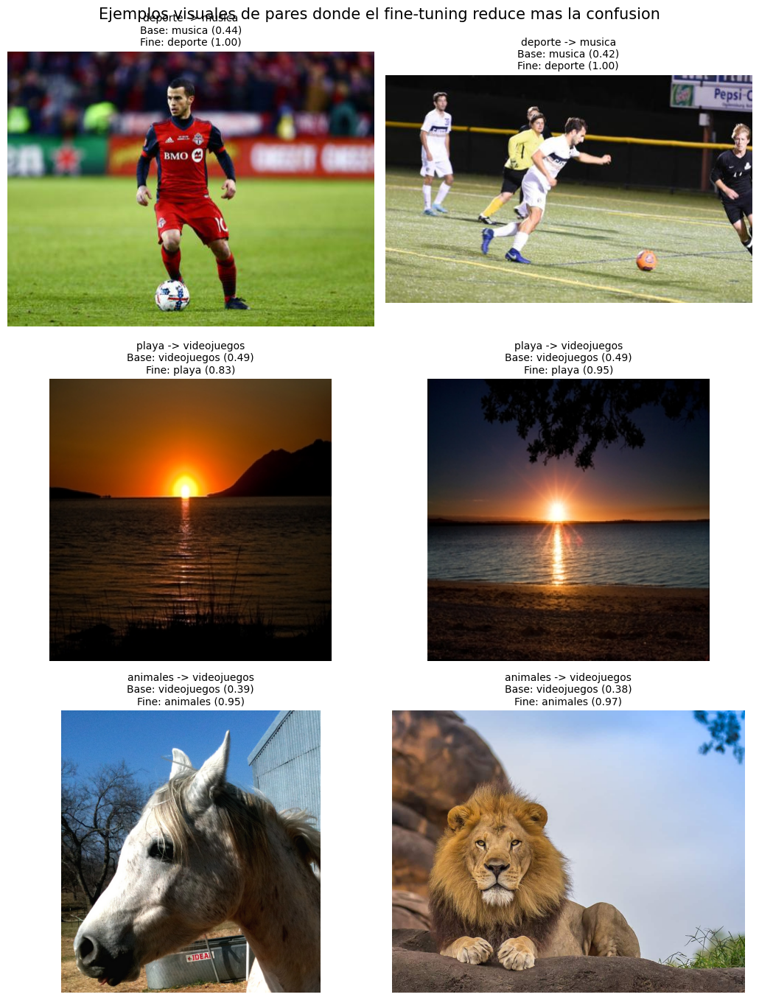

Pares de confusion que siguen costando al modelo fine-tuneado:


,clase_real,clase_predicha,errores_base,errores_fine_tuned,mejora_neta
30,videojuegos,coches,2,4,-2
22,playa,viajes,0,3,-3
4,animales,videojuegos,14,1,13
8,coches,videojuegos,7,1,6
27,viajes,musica,5,1,4
31,videojuegos,deporte,4,1,3
26,viajes,deporte,3,1,2
20,playa,deporte,1,1,0
21,playa,musica,1,1,0
11,cocina,musica,0,1,-1


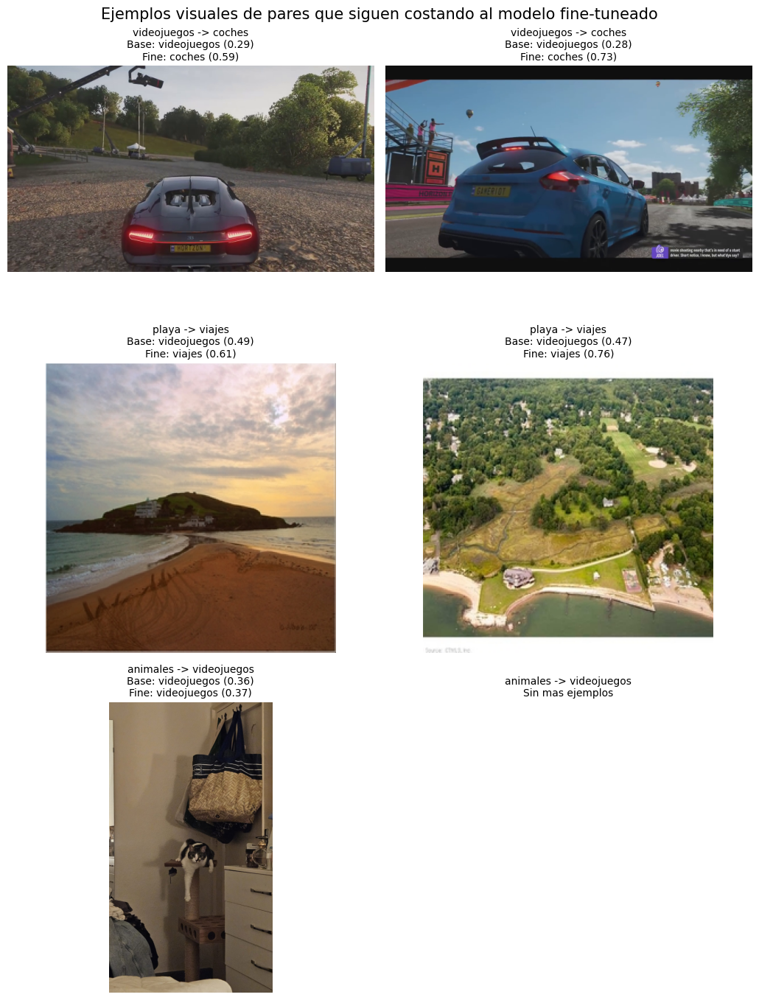

Resumen de errores por clase real:


,errores_base,errores_fine_tuned,reduccion_errores
animales,20,1,19
coches,18,1,17
cocina,18,1,17
deporte,17,0,17
musica,15,0,15
playa,18,5,13
viajes,18,3,15
videojuegos,10,5,5


Interpretacion de las matrices de confusion:
- El fine-tuning reduce especialmente la confusion deporte -> musica (15 a 0 errores).
- El fine-tuning reduce especialmente la confusion playa -> videojuegos (15 a 0 errores).
- El fine-tuning reduce especialmente la confusion animales -> videojuegos (14 a 1 errores).
- Sigue habiendo mezcla en videojuegos -> coches, lo que sugiere proximidad visual real entre ambas categorias.
- Sigue habiendo mezcla en playa -> viajes, lo que sugiere proximidad visual real entre ambas categorias.
- Sigue habiendo mezcla en videojuegos -> deporte, lo que sugiere proximidad visual real entre ambas categorias.


In [80]:
def mostrar_ejemplos_pares_confusion(
    pares_df,
    titulo,
    columna_predicha_modelo,
    max_pares=3,
    ejemplos_por_par=2,
):
    top_pairs = pares_df.head(max_pares).copy()
    if top_pairs.empty:
        print("No hay pares de confusion disponibles para mostrar ejemplos visuales.")
        return

    fig, axes = plt.subplots(
        len(top_pairs),
        ejemplos_por_par,
        figsize=(5.2 * ejemplos_por_par, 4.6 * len(top_pairs)),
    )

    if len(top_pairs) == 1 and ejemplos_por_par == 1:
        axes = np.array([[axes]])
    elif len(top_pairs) == 1:
        axes = np.array([axes])
    elif ejemplos_por_par == 1:
        axes = np.array([[ax] for ax in axes])

    for fila_idx, (_, par) in enumerate(top_pairs.iterrows()):
        casos_par = comparativa_modelos_df[
            (comparativa_modelos_df["clase_real"] == par["clase_real"])
            & (comparativa_modelos_df[columna_predicha_modelo] == par["clase_predicha"])
        ].sort_values(
            ["confianza_base", "confianza_fine_tuned"],
            ascending=[False, False],
        ).head(ejemplos_por_par)

        for col_idx in range(ejemplos_por_par):
            ax = axes[fila_idx, col_idx]
            ax.axis("off")

            if col_idx >= len(casos_par):
                ax.set_title(
                    "{} -> {}\nSin mas ejemplos".format(
                        par["clase_real"],
                        par["clase_predicha"],
                    ),
                    fontsize=10,
                )
                continue

            fila = casos_par.iloc[col_idx]
            imagen = Image.open(fila["ruta"]).convert("RGB")
            ax.imshow(imagen)
            ax.set_title(
                "{} -> {}\nBase: {} ({:.2f})\nFine: {} ({:.2f})".format(
                    par["clase_real"],
                    par["clase_predicha"],
                    fila["clase_predicha_base"],
                    fila["confianza_base"],
                    fila["clase_predicha_fine_tuned"],
                    fila["confianza_fine_tuned"],
                ),
                fontsize=10,
            )

    plt.suptitle(titulo, fontsize=15)
    plt.tight_layout()
    plt.show()


errores_base_df = construir_tabla_errores(cm_base, "base").rename(columns={"n_errores": "errores_base"})
errores_fine_tuned_df = construir_tabla_errores(cm_fine_tuned, "fine_tuned").rename(columns={"n_errores": "errores_fine_tuned"})
comparacion_confusiones_df = errores_base_df.drop(columns=["modelo"]).merge(
    errores_fine_tuned_df.drop(columns=["modelo"]),
    on=["clase_real", "clase_predicha"],
    how="outer",
).fillna(0)
comparacion_confusiones_df[["errores_base", "errores_fine_tuned"]] = comparacion_confusiones_df[
    ["errores_base", "errores_fine_tuned"]
].astype(int)
comparacion_confusiones_df["mejora_neta"] = (
    comparacion_confusiones_df["errores_base"] - comparacion_confusiones_df["errores_fine_tuned"]
)

mejoras_confusion_df = comparacion_confusiones_df.sort_values(
    ["mejora_neta", "errores_base"],
    ascending=[False, False],
).head(10)
persisten_confusion_df = comparacion_confusiones_df.sort_values(
    ["errores_fine_tuned", "errores_base"],
    ascending=[False, False],
).head(10)

print("Pares de confusion donde mas ayuda el fine-tuning:")
display(mejoras_confusion_df)
mostrar_ejemplos_pares_confusion(
    mejoras_confusion_df,
    "Ejemplos visuales de pares donde el fine-tuning reduce mas la confusion",
    columna_predicha_modelo="clase_predicha_base",
    max_pares=3,
    ejemplos_por_par=2,
)

print("Pares de confusion que siguen costando al modelo fine-tuneado:")
display(persisten_confusion_df)
mostrar_ejemplos_pares_confusion(
    persisten_confusion_df,
    "Ejemplos visuales de pares que siguen costando al modelo fine-tuneado",
    columna_predicha_modelo="clase_predicha_fine_tuned",
    max_pares=3,
    ejemplos_por_par=2,
)

resumen_errores_clase_df = pd.DataFrame(
    {
        "errores_base": cm_base.sum(axis=1) - np.diag(cm_base),
        "errores_fine_tuned": cm_fine_tuned.sum(axis=1) - np.diag(cm_fine_tuned),
    },
    index=class_names,
)
resumen_errores_clase_df["reduccion_errores"] = (
    resumen_errores_clase_df["errores_base"] - resumen_errores_clase_df["errores_fine_tuned"]
)
print("Resumen de errores por clase real:")
display(resumen_errores_clase_df)

mejoras_top = comparacion_confusiones_df.sort_values("mejora_neta", ascending=False).head(3)
persisten_top = comparacion_confusiones_df.sort_values("errores_fine_tuned", ascending=False).head(3)
print("Interpretacion de las matrices de confusion:")
for _, fila in mejoras_top.iterrows():
    print(
        "- El fine-tuning reduce especialmente la confusion {} -> {} ({} a {} errores).".format(
            fila["clase_real"],
            fila["clase_predicha"],
            fila["errores_base"],
            fila["errores_fine_tuned"],
        )
    )
for _, fila in persisten_top.iterrows():
    print(
        "- Sigue habiendo mezcla en {} -> {}, lo que sugiere proximidad visual real entre ambas categorias.".format(
            fila["clase_real"],
            fila["clase_predicha"],
        )
    )


Ejemplos correctamente clasificados por ambos modelos:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,confianza_base,confianza_fine_tuned,delta_confianza
133,data\images\test\videojuegos\image_452.png,videojuegos,videojuegos,videojuegos,0.189,0.978,0.789
82,data\images\test\musica\muhammadh-saamy-nXD13z...,musica,musica,musica,0.243,0.986,0.744
131,data\images\test\videojuegos\image_450.png,videojuegos,videojuegos,videojuegos,0.229,0.963,0.734
77,data\images\test\musica\deep-sonowal-X-oKPBGdB...,musica,musica,musica,0.199,0.905,0.706
58,data\images\test\deporte\00000483.jpg,deporte,deporte,deporte,0.216,0.902,0.686
74,data\images\test\musica\4.jpg,musica,musica,musica,0.331,0.999,0.669


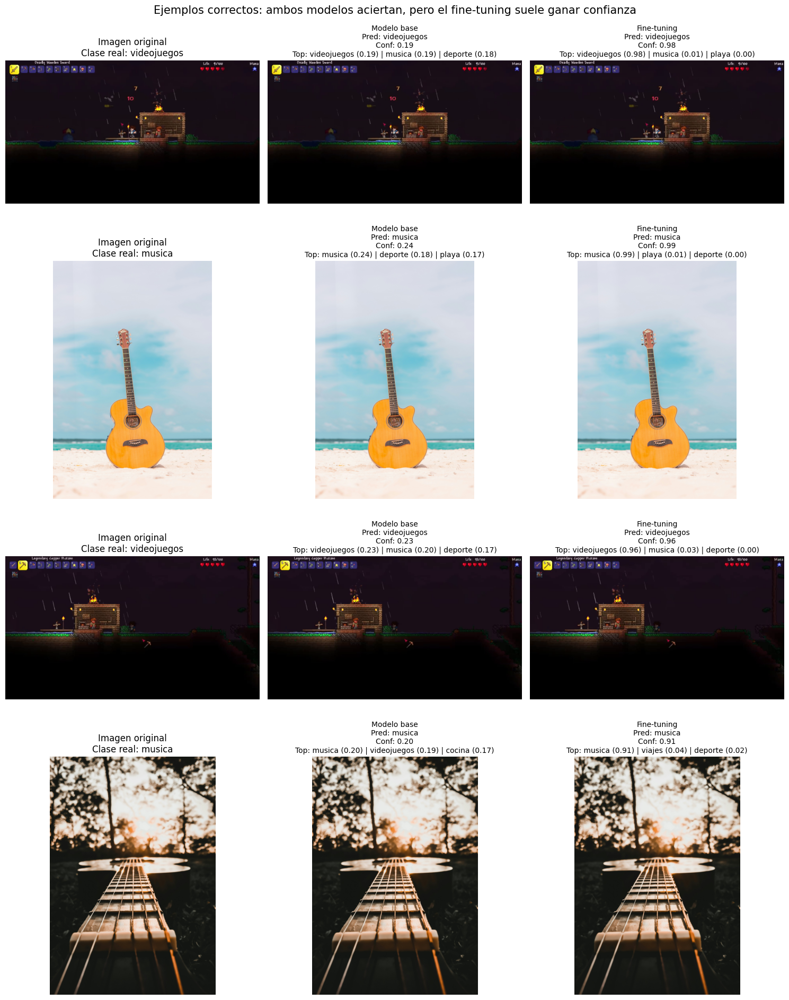

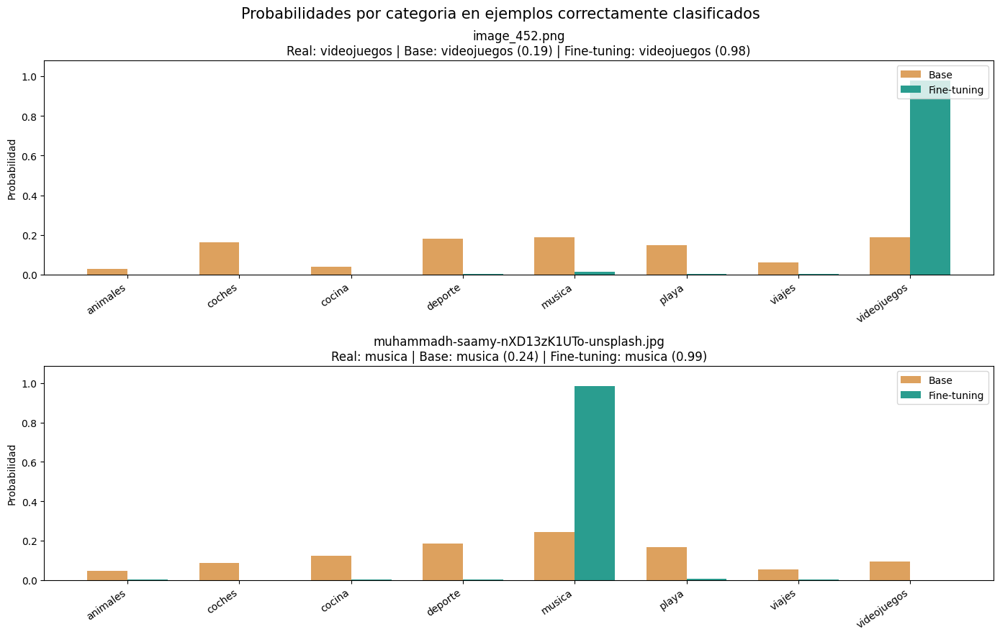

Ejemplos donde el fine-tuning corrige al modelo base:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,confianza_base,confianza_fine_tuned
62,data\images\test\deporte\00000697.jpg,deporte,musica,deporte,0.357,1.0
71,data\images\test\deporte\00000803.jpg,deporte,musica,deporte,0.422,1.0
70,data\images\test\deporte\00000801.jpg,deporte,musica,deporte,0.444,1.0
81,data\images\test\musica\kwi9w.jpg,musica,coches,musica,0.359,1.0
56,data\images\test\deporte\00000426.jpg,deporte,musica,deporte,0.298,1.0
80,data\images\test\musica\iww.jpg,musica,playa,musica,0.275,1.0


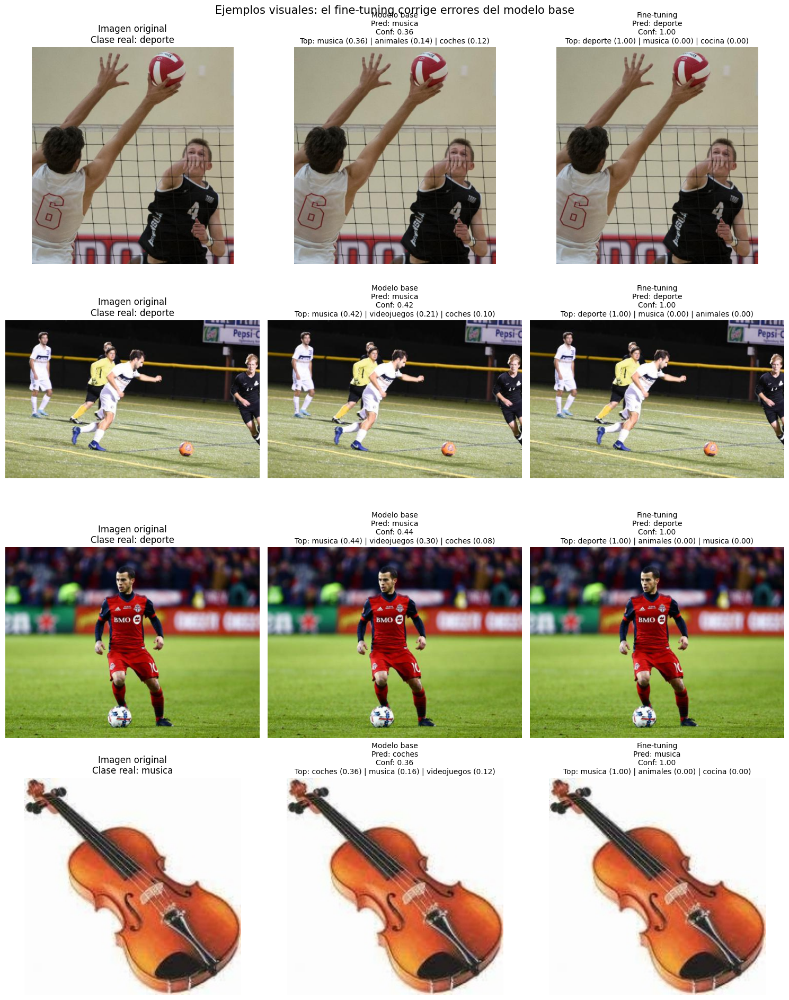

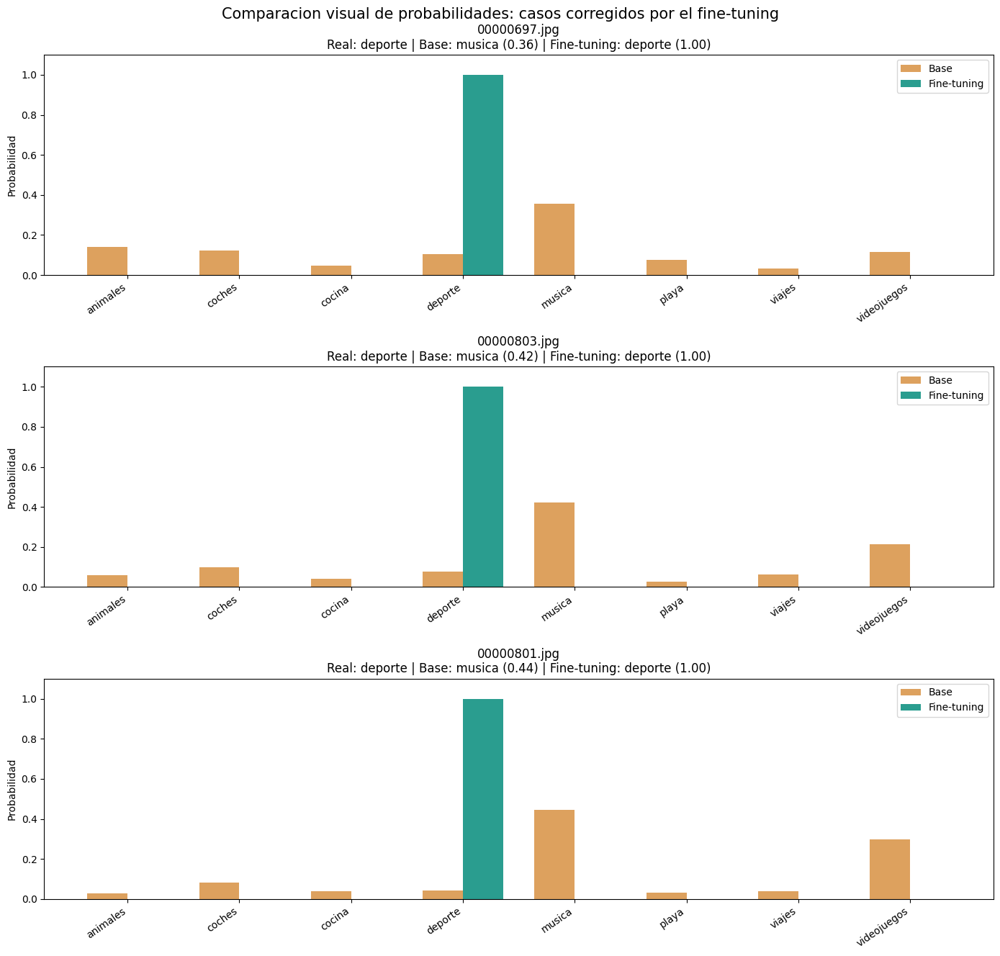

Ejemplos donde ambos modelos siguen fallando:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,confianza_base,confianza_fine_tuned
134,data\images\test\videojuegos\image_516.png,videojuegos,musica,coches,0.189,0.959
53,data\images\test\cocina\tea-cakes.jpg,cocina,videojuegos,musica,0.397,0.822
106,data\images\test\playa\gsun_0852704014845c6d64...,playa,videojuegos,viajes,0.473,0.757
23,data\images\test\coches\113.jpg,coches,deporte,videojuegos,0.280,0.694
99,data\images\test\playa\gsun_04a9e170c8f61eeebc...,playa,videojuegos,musica,0.298,0.664
98,data\images\test\playa\gsun_02acf3f2f873f92ff0...,playa,videojuegos,viajes,0.485,0.614


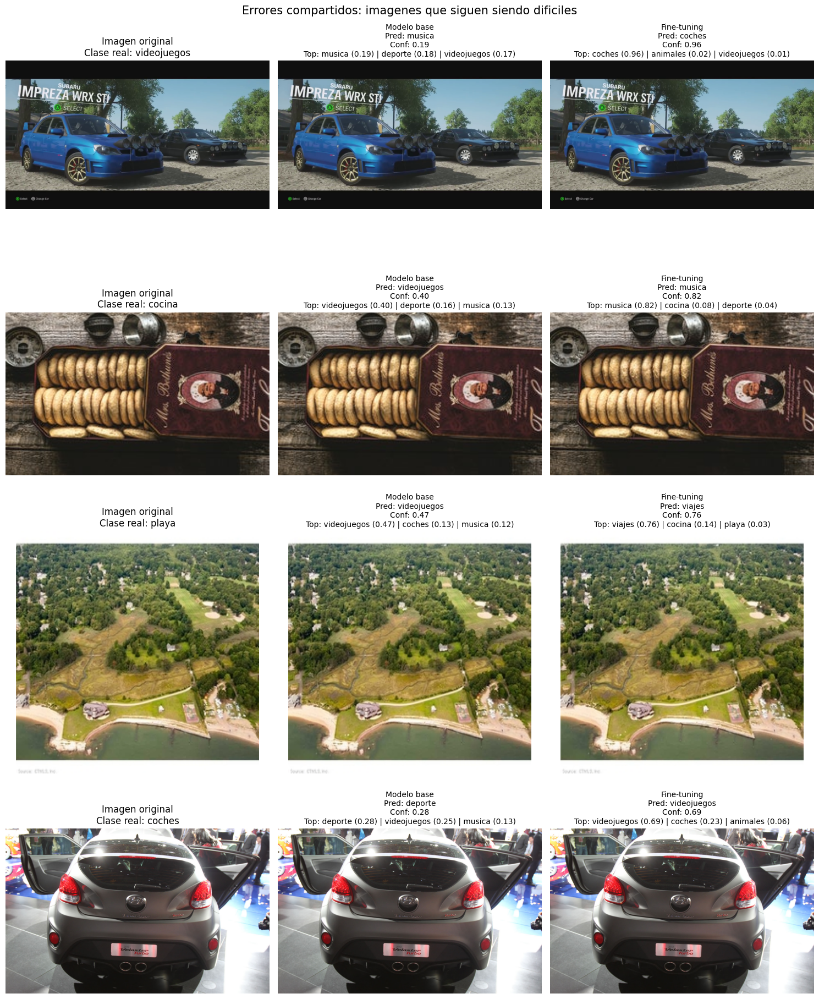

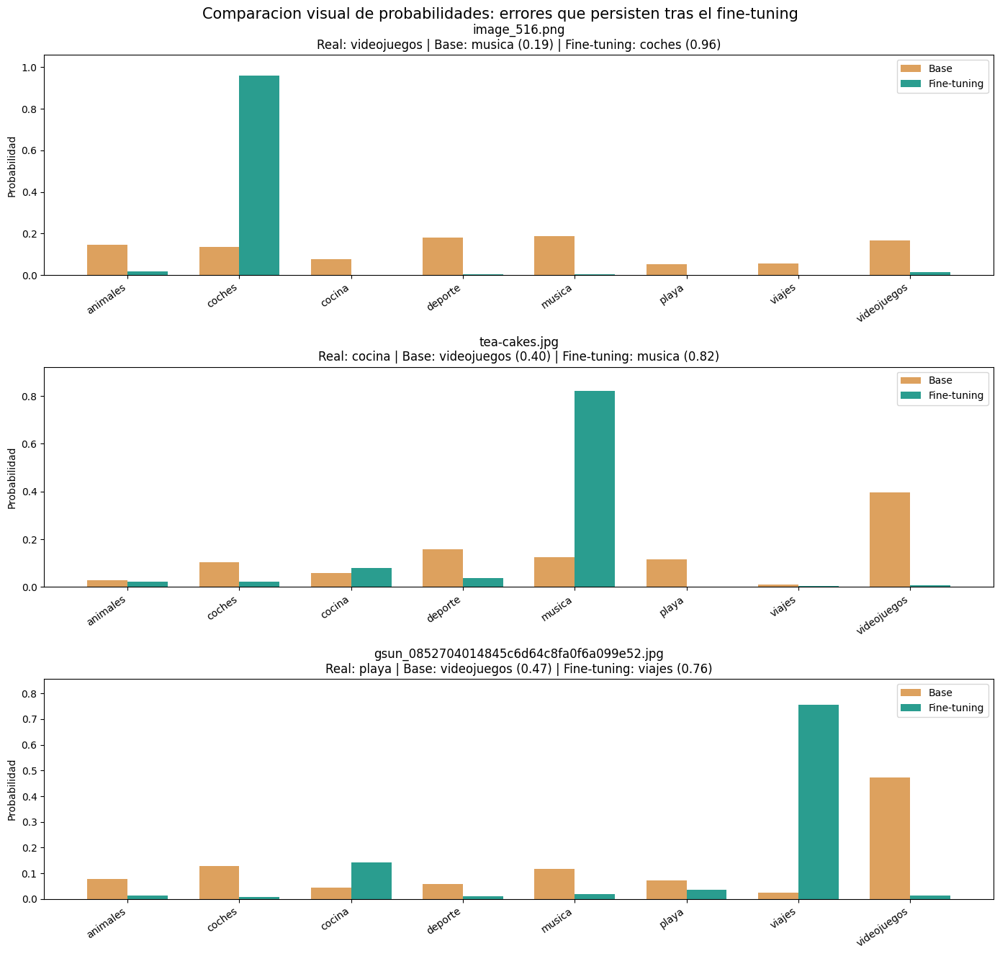

Casos puntuales donde el fine-tuning empeora una prediccion correcta del modelo base:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,confianza_base,confianza_fine_tuned
138,data\images\test\videojuegos\image_75.png,videojuegos,videojuegos,deporte,0.364,0.476
129,data\images\test\videojuegos\image_399.png,videojuegos,videojuegos,coches,0.290,0.587
128,data\images\test\videojuegos\image_360.png,videojuegos,videojuegos,coches,0.276,0.729
143,data\images\test\videojuegos\image_943.png,videojuegos,videojuegos,coches,0.236,0.347


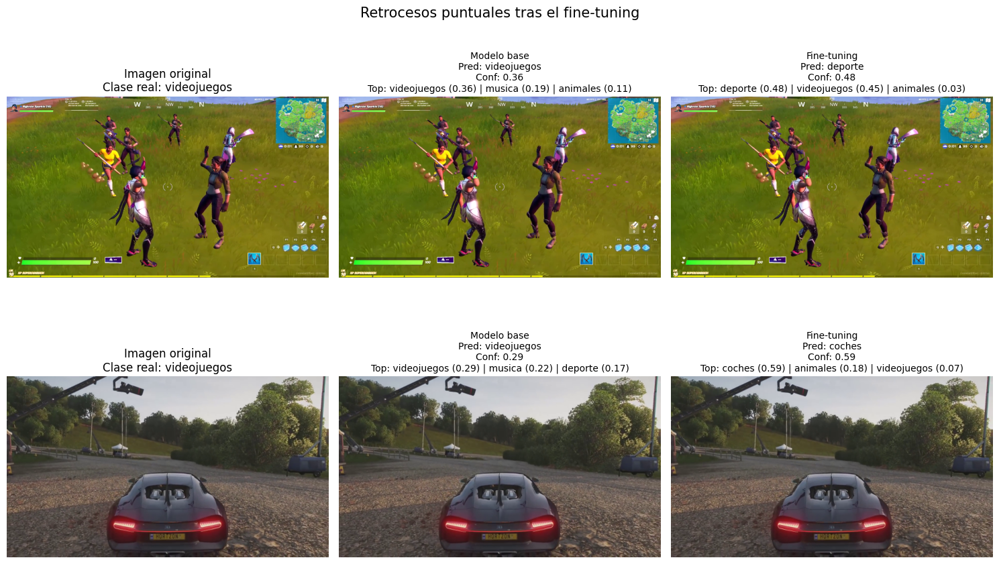

In [81]:
def mostrar_comparativa_visual(casos_df, titulo, max_casos=4):
    subset = casos_df.head(max_casos).copy()
    if subset.empty:
        print("No hay casos disponibles para esta comparativa visual.")
        return

    fig, axes = plt.subplots(len(subset), 3, figsize=(15, 4.8 * len(subset)))
    if len(subset) == 1:
        axes = np.array([axes])

    for fila_idx, (_, fila) in enumerate(subset.iterrows()):
        imagen = Image.open(fila["ruta"]).convert("RGB")
        top_base = shorten(str(fila["top_k_resumen_base"]), width=60, placeholder="...")
        top_fine = shorten(str(fila["top_k_resumen_fine_tuned"]), width=60, placeholder="...")

        axes[fila_idx, 0].imshow(imagen)
        axes[fila_idx, 0].set_title(
            "Imagen original\nClase real: {}".format(fila["clase_real"])
        )
        axes[fila_idx, 1].imshow(imagen)
        axes[fila_idx, 1].set_title(
            "Modelo base\nPred: {}\nConf: {:.2f}\nTop: {}".format(
                fila["clase_predicha_base"], fila["confianza_base"], top_base
            ),
            fontsize=10,
        )
        axes[fila_idx, 2].imshow(imagen)
        axes[fila_idx, 2].set_title(
            "Fine-tuning\nPred: {}\nConf: {:.2f}\nTop: {}".format(
                fila["clase_predicha_fine_tuned"], fila["confianza_fine_tuned"], top_fine
            ),
            fontsize=10,
        )
        for ax in axes[fila_idx]:
            ax.axis("off")

    plt.suptitle(titulo, fontsize=15)
    plt.tight_layout()
    plt.show()


def mostrar_comparativa_probabilidades(casos_df, titulo, max_casos=3):
    subset = casos_df.head(max_casos).copy()
    if subset.empty:
        print("No hay casos disponibles para la comparacion de probabilidades.")
        return

    fig, axes = plt.subplots(len(subset), 1, figsize=(14, 4.5 * len(subset)))
    if len(subset) == 1:
        axes = [axes]

    x = np.arange(len(class_names))
    width = 0.36

    for ax, (_, fila) in zip(axes, subset.iterrows()):
        probs_base = np.array(fila["vector_probabilidades_base"])
        probs_fine = np.array(fila["vector_probabilidades_fine_tuned"])
        ax.bar(x - width / 2, probs_base, width=width, color="#DDA15E", label="Base")
        ax.bar(x + width / 2, probs_fine, width=width, color="#2A9D8F", label="Fine-tuning")
        ax.set_xticks(x)
        ax.set_xticklabels(class_names, rotation=35, ha="right")
        ax.set_ylim(0, max(probs_base.max(), probs_fine.max()) + 0.1)
        ax.set_ylabel("Probabilidad")
        ax.set_title(
            "{}\nReal: {} | Base: {} ({:.2f}) | Fine-tuning: {} ({:.2f})".format(
                Path(fila["ruta"]).name,
                fila["clase_real"],
                fila["clase_predicha_base"],
                fila["confianza_base"],
                fila["clase_predicha_fine_tuned"],
                fila["confianza_fine_tuned"],
            )
        )
        ax.legend(loc="upper right")

    plt.suptitle(titulo, fontsize=15)
    plt.tight_layout()
    plt.show()


casos_corregidos_df = comparativa_modelos_df[
    comparativa_modelos_df["mejora_fine_tuning"] == "corrige_error_base"
].sort_values(["confianza_fine_tuned", "delta_confianza"], ascending=[False, False])
casos_correctos_compartidos_df = comparativa_modelos_df[
    (comparativa_modelos_df["acierto_base"]) & (comparativa_modelos_df["acierto_fine_tuned"])
].sort_values(["delta_confianza", "confianza_fine_tuned"], ascending=[False, False])
casos_dificiles_compartidos_df = comparativa_modelos_df[
    (~comparativa_modelos_df["acierto_base"]) & (~comparativa_modelos_df["acierto_fine_tuned"])
].sort_values("confianza_fine_tuned", ascending=False)
casos_empeorados_df = comparativa_modelos_df[
    comparativa_modelos_df["mejora_fine_tuning"] == "empeora_acierto_base"
].sort_values("confianza_base", ascending=False)

print("Ejemplos correctamente clasificados por ambos modelos:")
display(
    casos_correctos_compartidos_df[
        [
            "ruta",
            "clase_real",
            "clase_predicha_base",
            "clase_predicha_fine_tuned",
            "confianza_base",
            "confianza_fine_tuned",
            "delta_confianza",
        ]
    ].head(6).round(3)
)
mostrar_comparativa_visual(
    casos_correctos_compartidos_df,
    "Ejemplos correctos: ambos modelos aciertan, pero el fine-tuning suele ganar confianza",
    max_casos=4,
)
mostrar_comparativa_probabilidades(
    casos_correctos_compartidos_df,
    "Probabilidades por categoria en ejemplos correctamente clasificados",
    max_casos=2,
)

print("Ejemplos donde el fine-tuning corrige al modelo base:")
display(
    casos_corregidos_df[
        [
            "ruta",
            "clase_real",
            "clase_predicha_base",
            "clase_predicha_fine_tuned",
            "confianza_base",
            "confianza_fine_tuned",
        ]
    ].head(6).round(3)
)
mostrar_comparativa_visual(
    casos_corregidos_df,
    "Ejemplos visuales: el fine-tuning corrige errores del modelo base",
    max_casos=4,
)
mostrar_comparativa_probabilidades(
    casos_corregidos_df,
    "Comparacion visual de probabilidades: casos corregidos por el fine-tuning",
    max_casos=3,
)

print("Ejemplos donde ambos modelos siguen fallando:")
display(
    casos_dificiles_compartidos_df[
        [
            "ruta",
            "clase_real",
            "clase_predicha_base",
            "clase_predicha_fine_tuned",
            "confianza_base",
            "confianza_fine_tuned",
        ]
    ].head(6).round(3)
)
mostrar_comparativa_visual(
    casos_dificiles_compartidos_df,
    "Errores compartidos: imagenes que siguen siendo dificiles",
    max_casos=4,
)
mostrar_comparativa_probabilidades(
    casos_dificiles_compartidos_df,
    "Comparacion visual de probabilidades: errores que persisten tras el fine-tuning",
    max_casos=3,
)

if not casos_empeorados_df.empty:
    print("Casos puntuales donde el fine-tuning empeora una prediccion correcta del modelo base:")
    display(
        casos_empeorados_df[
            [
                "ruta",
                "clase_real",
                "clase_predicha_base",
                "clase_predicha_fine_tuned",
                "confianza_base",
                "confianza_fine_tuned",
            ]
        ].head(4).round(3)
    )
    mostrar_comparativa_visual(
        casos_empeorados_df,
        "Retrocesos puntuales tras el fine-tuning",
        max_casos=2,
    )



## 5. Limitaciones del modelo

Los siguientes ejemplos no se ocultan porque son precisamente los que dan valor interpretativo al experimento. El objetivo no es presentar un modelo perfecto, sino mostrar donde el ajuste de la ultima capa ayuda y donde el dominio sigue siendo ambiguo.

Se revisan cuatro patrones concretos:

- animales en entornos complejos o poco centrados en el sujeto.
- mezcla visual entre `playa` y `viajes`.
- escenas de `coches` con informacion de contexto que empuja hacia `viajes`.
- imagenes con varias categorias plausibles al mismo tiempo.


,limitacion,n_casos
0,Animales en entornos complejos,7
1,Mezcla playa y viajes,32
2,Coches en contextos ambiguos,5
3,Varias categorias plausibles,31


Animales en entornos complejos:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,top_k_resumen_fine_tuned
0,data\images\test\animales\4420b729-c6d7-496a-8...,animales,videojuegos,videojuegos,videojuegos (0.37) | musica (0.35) | animales ...
14,data\images\test\animales\horse952.jpg,animales,videojuegos,animales,animales (0.65) | musica (0.20) | viajes (0.06)
4,data\images\test\animales\IMG-20260526-WA0043.jpg,animales,coches,animales,animales (0.58) | videojuegos (0.39) | deporte...


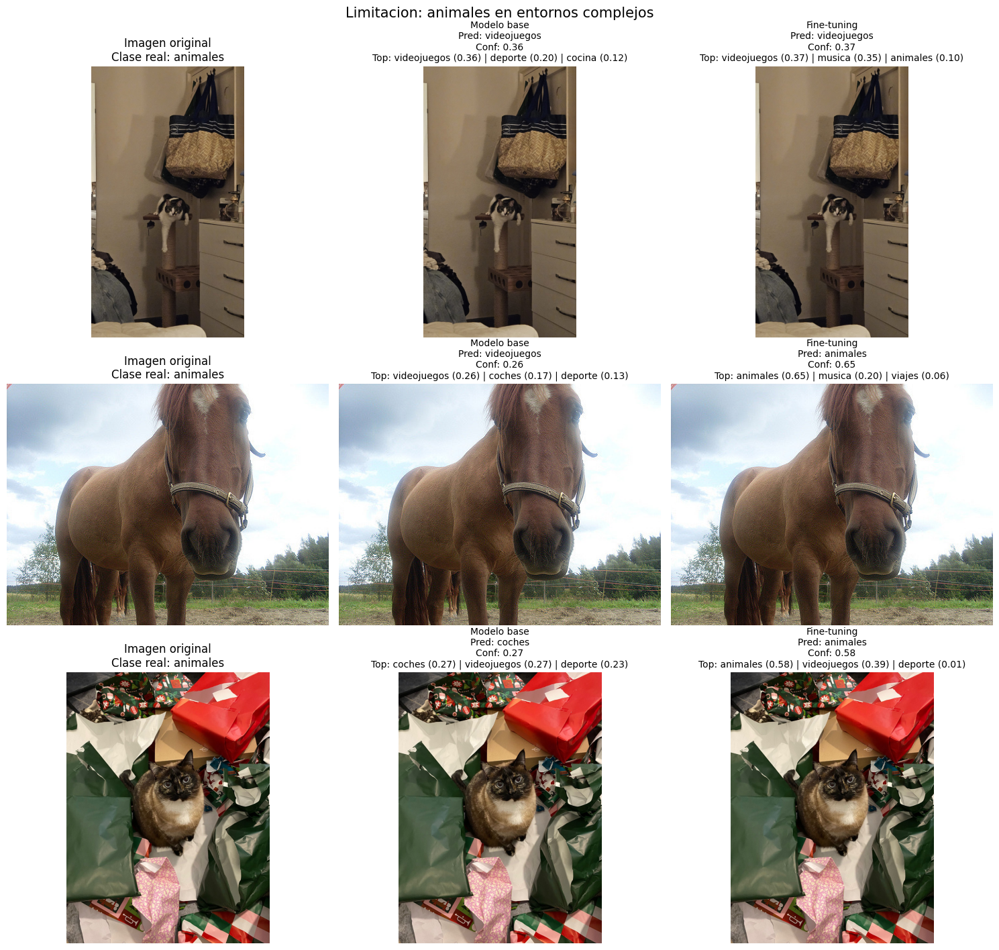

Interpretacion: cuando el animal no ocupa el foco principal o comparte escena con fondos urbanos, agua u objetos muy salientes, la decision sigue siendo fragil.
Mezcla playa y viajes:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,top_k_resumen_fine_tuned
106,data\images\test\playa\gsun_0852704014845c6d64...,playa,videojuegos,viajes,viajes (0.76) | cocina (0.14) | playa (0.03)
98,data\images\test\playa\gsun_02acf3f2f873f92ff0...,playa,videojuegos,viajes,viajes (0.61) | playa (0.22) | videojuegos (0.14)
115,data\images\test\viajes\00000079_(2).jpg,viajes,videojuegos,playa,playa (0.60) | viajes (0.40) | videojuegos (0.00)


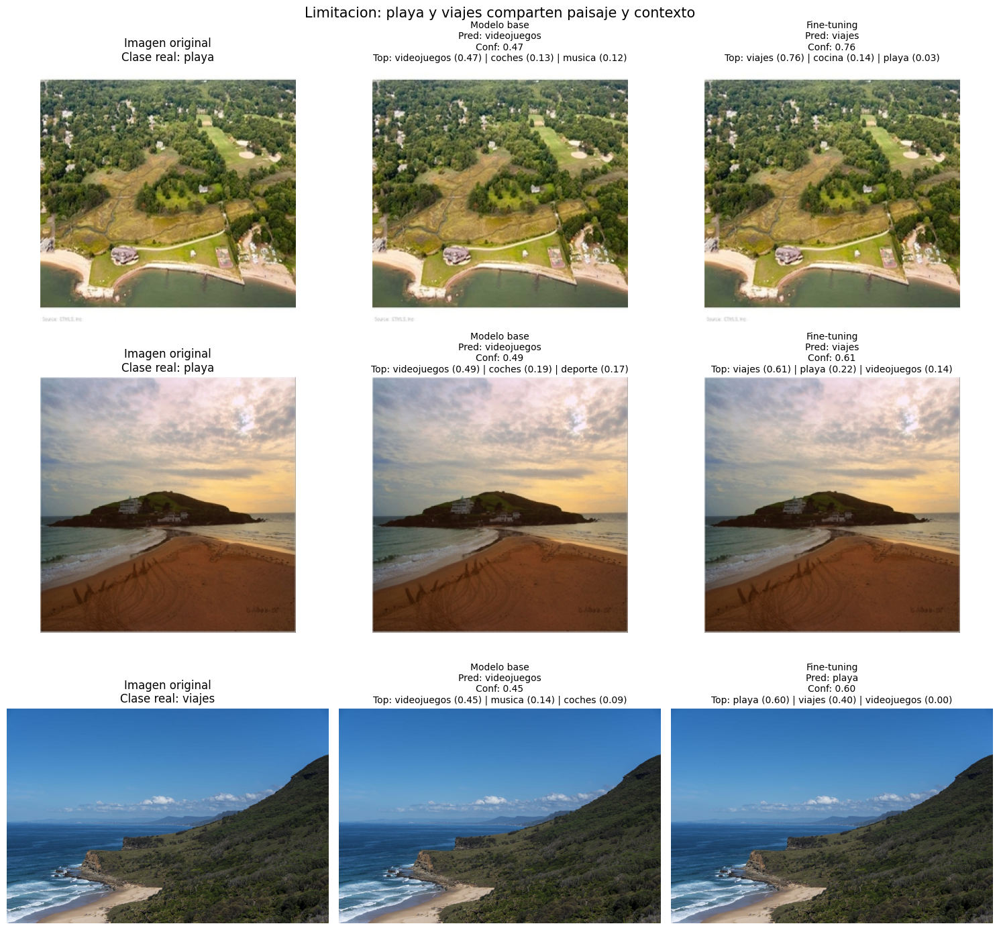

Interpretacion: estas dos categorias comparten horizonte, arena, costa, carreteras y escenas abiertas. El fine-tuning reduce parte del ruido, pero no elimina la ambiguedad visual de fondo.
Coches en contextos ambiguos:


,ruta,clase_real,clase_predicha_base,clase_predicha_fine_tuned,top_k_resumen_fine_tuned
23,data\images\test\coches\113.jpg,coches,deporte,videojuegos,videojuegos (0.69) | coches (0.23) | animales ...
28,data\images\test\coches\118.jpg,coches,musica,coches,coches (0.73) | animales (0.26) | deporte (0.00)
21,data\images\test\coches\111.jpg,coches,deporte,coches,coches (0.56) | animales (0.38) | musica (0.02)


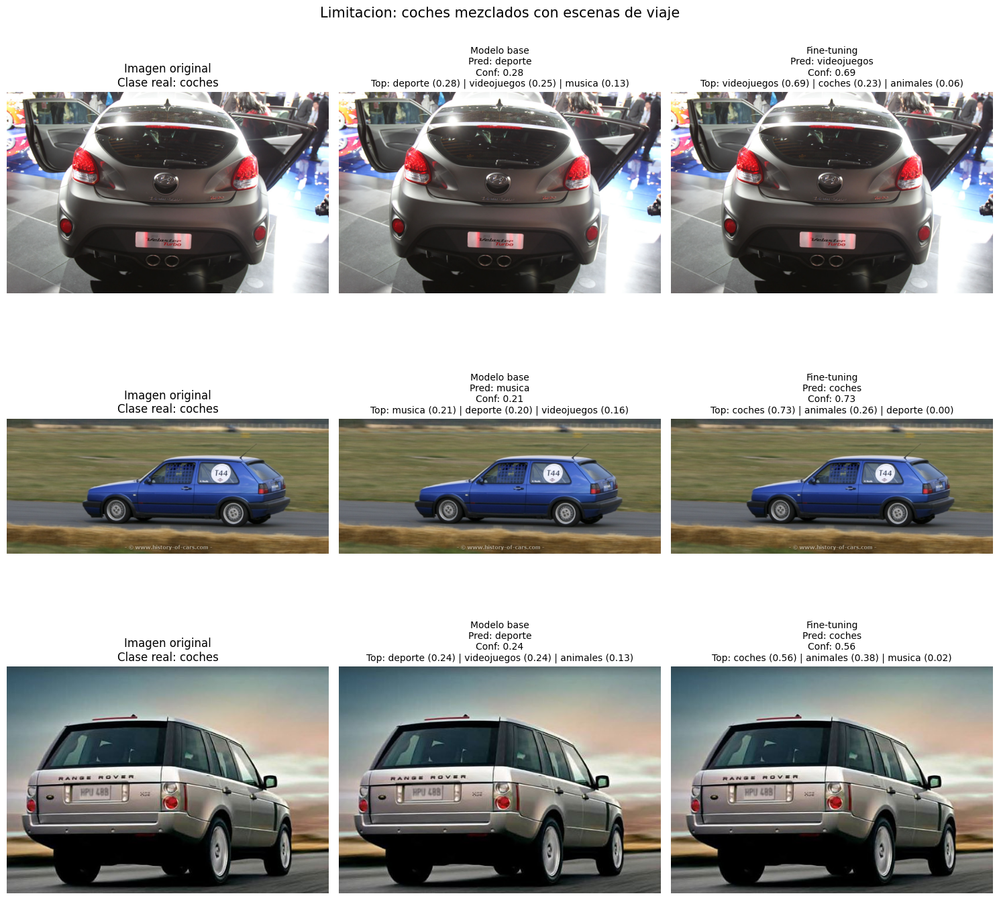

Interpretacion: cuando el coche aparece como parte de una escapada, el modelo puede priorizar el contexto del viaje frente al objeto principal.
Imagenes con varias categorias plausibles:


,ruta,clase_real,clase_predicha_fine_tuned,categorias_confiables_resumen_fine_tuned
128,data\images\test\videojuegos\image_360.png,videojuegos,coches,coches (0.73) | videojuegos (0.24)
28,data\images\test\coches\118.jpg,coches,coches,coches (0.73) | animales (0.26)
112,data\images\test\viajes\00000074_(3).jpg,viajes,viajes,viajes (0.73) | playa (0.24)
100,data\images\test\playa\gsun_04faf42cec6a609a44...,playa,playa,playa (0.70) | viajes (0.29)
23,data\images\test\coches\113.jpg,coches,videojuegos,videojuegos (0.69) | coches (0.23)


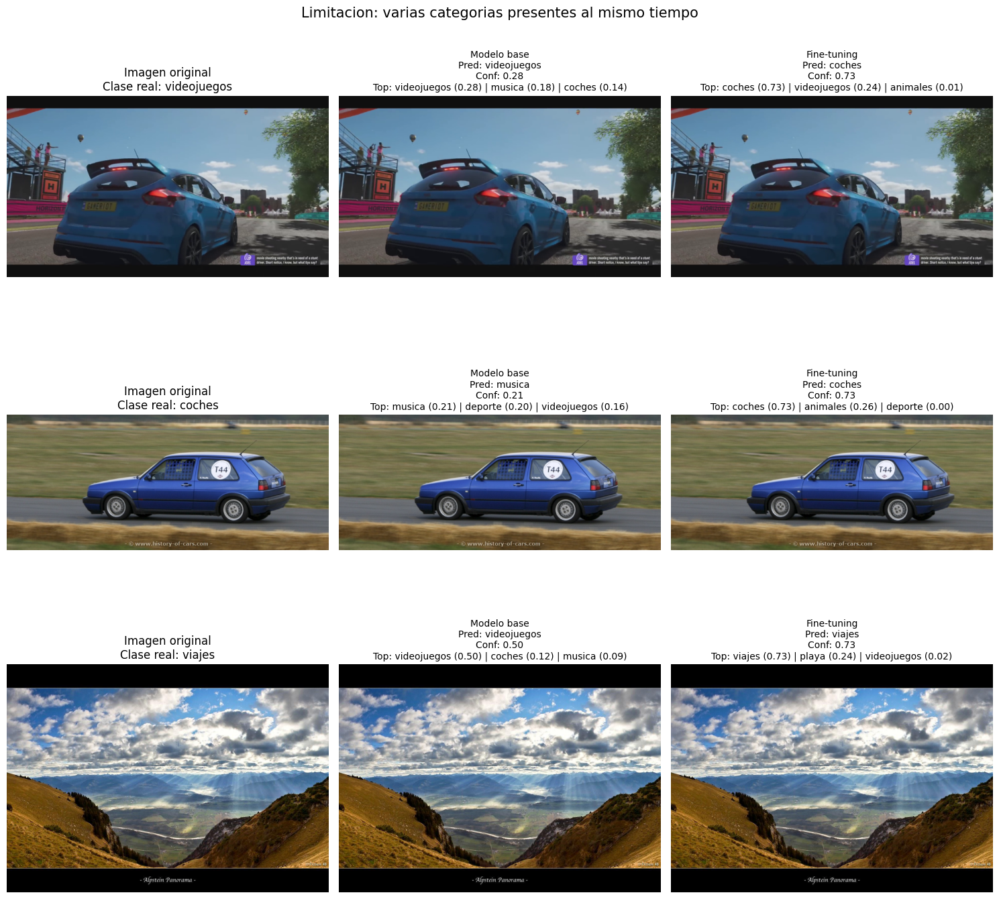

Interpretacion: la salida multiclase ayuda a no forzar una lectura artificialmente unica. En estas escenas el ranking ofrece mas informacion que la etiqueta top-1 por si sola.
Comparativa visual final:


,Aspecto,Modelo Base,Fine-Tuning
0,Accuracy,0.0822,0.8904
1,Adaptacion dominio,"Reconoce rasgos visuales generales, pero la ca...",Ajusta la ultima capa a las categorias del pro...
2,Generalizacion,Buena como punto de partida gracias a ImageNet.,Mantiene la generalizacion visual y mejora la ...
3,Categorias especificas,Tiende a confundir clases cercanas porque usa ...,Se especializa mejor en pares como playa-viaje...
4,Rendimiento final,Baseline visual defendible para comparar.,Opcion final recomendada para integrar el comp...


Cierre interpretativo:
- El modelo base demuestra que el conocimiento visual general ya contiene senales utiles para el problema.
- El fine-tuning de la ultima capa convierte ese conocimiento general en una decision mas alineada con el dominio del TFM.
- Los errores que permanecen no invalidan el enfoque: revelan precisamente que algunas categorias comparten contexto visual real.


In [82]:
casos_animales_complejos_df = comparativa_modelos_df[
    (comparativa_modelos_df["clase_real"] == "animales")
    & (
        (~comparativa_modelos_df["acierto_fine_tuned"])
        | (comparativa_modelos_df["n_categorias_confiables_fine_tuned"] > 1)
        | (comparativa_modelos_df["confianza_fine_tuned"] < 0.65)
    )
].sort_values(["acierto_fine_tuned", "confianza_fine_tuned"], ascending=[True, False])

casos_playa_viajes_df = comparativa_modelos_df[
    comparativa_modelos_df["clase_real"].isin(["playa", "viajes"])
    & (
        comparativa_modelos_df["clase_predicha_fine_tuned"].isin(["playa", "viajes"])
        | comparativa_modelos_df["clase_predicha_base"].isin(["playa", "viajes"])
    )
    & (
        (~comparativa_modelos_df["acierto_fine_tuned"])
        | comparativa_modelos_df["cambio_prediccion"]
        | (comparativa_modelos_df["n_categorias_confiables_fine_tuned"] > 1)
    )
].sort_values(["acierto_fine_tuned", "confianza_fine_tuned"], ascending=[True, False])

casos_coches_ambiguos_df = comparativa_modelos_df[
    (comparativa_modelos_df["clase_real"] == "coches")
    & (
        (~comparativa_modelos_df["acierto_fine_tuned"])
        | comparativa_modelos_df["clase_predicha_fine_tuned"].isin(["viajes", "playa"])
        | (comparativa_modelos_df["n_categorias_confiables_fine_tuned"] > 1)
    )
].sort_values(["acierto_fine_tuned", "confianza_fine_tuned"], ascending=[True, False])

casos_multicategoria_df = comparativa_modelos_df[
    comparativa_modelos_df["n_categorias_confiables_fine_tuned"] > 1
].sort_values("confianza_fine_tuned", ascending=False)

resumen_limitaciones_df = pd.DataFrame(
    [
        {"limitacion": "Animales en entornos complejos", "n_casos": len(casos_animales_complejos_df)},
        {"limitacion": "Mezcla playa y viajes", "n_casos": len(casos_playa_viajes_df)},
        {"limitacion": "Coches en contextos ambiguos", "n_casos": len(casos_coches_ambiguos_df)},
        {"limitacion": "Varias categorias plausibles", "n_casos": len(casos_multicategoria_df)},
    ]
)
display(resumen_limitaciones_df)

print("Animales en entornos complejos:")
display(
    casos_animales_complejos_df[
        ["ruta", "clase_real", "clase_predicha_base", "clase_predicha_fine_tuned", "top_k_resumen_fine_tuned"]
    ].head(3)
)
mostrar_comparativa_visual(casos_animales_complejos_df, "Limitacion: animales en entornos complejos", max_casos=3)
print("Interpretacion: cuando el animal no ocupa el foco principal o comparte escena con fondos urbanos, agua u objetos muy salientes, la decision sigue siendo fragil.")

print("Mezcla playa y viajes:")
display(
    casos_playa_viajes_df[
        ["ruta", "clase_real", "clase_predicha_base", "clase_predicha_fine_tuned", "top_k_resumen_fine_tuned"]
    ].head(3)
)
mostrar_comparativa_visual(casos_playa_viajes_df, "Limitacion: playa y viajes comparten paisaje y contexto", max_casos=3)
print("Interpretacion: estas dos categorias comparten horizonte, arena, costa, carreteras y escenas abiertas. El fine-tuning reduce parte del ruido, pero no elimina la ambiguedad visual de fondo.")

print("Coches en contextos ambiguos:")
display(
    casos_coches_ambiguos_df[
        ["ruta", "clase_real", "clase_predicha_base", "clase_predicha_fine_tuned", "top_k_resumen_fine_tuned"]
    ].head(3)
)
mostrar_comparativa_visual(casos_coches_ambiguos_df, "Limitacion: coches mezclados con escenas de viaje", max_casos=3)
print("Interpretacion: cuando el coche aparece como parte de una escapada, el modelo puede priorizar el contexto del viaje frente al objeto principal.")

print("Imagenes con varias categorias plausibles:")
display(
    casos_multicategoria_df[
        ["ruta", "clase_real", "clase_predicha_fine_tuned", "categorias_confiables_resumen_fine_tuned"]
    ].head(5)
)
mostrar_comparativa_visual(casos_multicategoria_df, "Limitacion: varias categorias presentes al mismo tiempo", max_casos=3)
print("Interpretacion: la salida multiclase ayuda a no forzar una lectura artificialmente unica. En estas escenas el ranking ofrece mas informacion que la etiqueta top-1 por si sola.")

comparativa_visual_final = pd.DataFrame(
    [
        {"Aspecto": "Accuracy", "Modelo Base": f"{resultados['base']['accuracy']:.4f}", "Fine-Tuning": f"{resultados['fine_tuned']['accuracy']:.4f}"},
        {"Aspecto": "Adaptacion dominio", "Modelo Base": "Reconoce rasgos visuales generales, pero la cabeza final aun no esta adaptada al TFM.", "Fine-Tuning": "Ajusta la ultima capa a las categorias del proyecto sin tocar el extractor visual preentrenado."},
        {"Aspecto": "Generalizacion", "Modelo Base": "Buena como punto de partida gracias a ImageNet.", "Fine-Tuning": "Mantiene la generalizacion visual y mejora la decision en el dominio especifico."},
        {"Aspecto": "Categorias especificas", "Modelo Base": "Tiende a confundir clases cercanas porque usa una salida aun generica.", "Fine-Tuning": "Se especializa mejor en pares como playa-viajes o coches-viajes, aunque no elimina toda la ambiguedad."},
        {"Aspecto": "Rendimiento final", "Modelo Base": "Baseline visual defendible para comparar.", "Fine-Tuning": "Opcion final recomendada para integrar el componente visual del sistema."},
    ]
)
print("Comparativa visual final:")
display(comparativa_visual_final)
print("Cierre interpretativo:")
print("- El modelo base demuestra que el conocimiento visual general ya contiene senales utiles para el problema.")
print("- El fine-tuning de la ultima capa convierte ese conocimiento general en una decision mas alineada con el dominio del TFM.")
print("- Los errores que permanecen no invalidan el enfoque: revelan precisamente que algunas categorias comparten contexto visual real.")


## 6. Prueba individual con una imagen externa

La ultima celda se mantiene como demostracion practica: dada una ruta absoluta, el notebook muestra la imagen, compara modelo base y fine-tuned y devuelve varias categorias ordenadas por confianza.


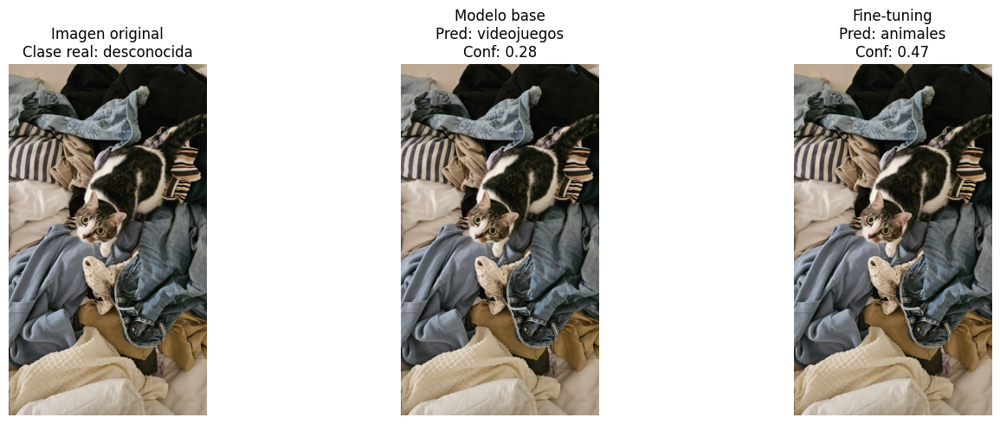

Ranking mostrado: top-3 con umbral minimo 0.20
Resumen por modelo:


,modelo,ruta,clase_real,clase_predicha,confianza,top_k_resumen,categorias_confiables_resumen,n_categorias_confiables
0,base,C:\Users\rafae\Desktop\dbdee05f-fdf2-4297-b62c...,desconocida,videojuegos,0.280387,videojuegos (0.28) | coches (0.17) | deporte (...,videojuegos (0.28),1
1,fine_tuned,C:\Users\rafae\Desktop\dbdee05f-fdf2-4297-b62c...,desconocida,animales,0.465627,animales (0.47) | deporte (0.24) | viajes (0.11),animales (0.47) | deporte (0.24),2


Detalle de categorias por modelo:


,modelo,posicion,categoria,confianza,supera_umbral
0,base,1,videojuegos,0.280387,True
1,base,2,coches,0.174880,False
2,base,3,deporte,0.124019,False
3,fine_tuned,1,animales,0.465627,True
4,fine_tuned,2,deporte,0.236940,True
5,fine_tuned,3,viajes,0.113299,False


In [83]:
from pathlib import Path
RUTA_IMAGEN_ABSOLUTA = Path(r"C:\Users\rafae\Desktop\dbdee05f-fdf2-4297-b62c-d07dc107ffc2.jpg")


def obtener_modelos_para_inferencia():
    return {"base": modelo_base, "fine_tuned": modelo_fine_tuned}


def mostrar_resumen_imagen_individual(ruta_imagen, predicciones_df):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    imagen = Image.open(ruta_imagen).convert("RGB")
    for ax in axes:
        ax.imshow(imagen)
        ax.axis("off")
    fila_base = predicciones_df[predicciones_df["modelo"] == "base"].iloc[0]
    fila_fine = predicciones_df[predicciones_df["modelo"] == "fine_tuned"].iloc[0]
    axes[0].set_title("Imagen original\nClase real: {}".format(fila_base["clase_real"]))
    axes[1].set_title(
        "Modelo base\nPred: {}\nConf: {:.2f}".format(fila_base["clase_predicha"], fila_base["confianza"])
    )
    axes[2].set_title(
        "Fine-tuning\nPred: {}\nConf: {:.2f}".format(fila_fine["clase_predicha"], fila_fine["confianza"])
    )
    plt.tight_layout()
    plt.show()


@torch.no_grad()
def predecir_imagen_individual(ruta_imagen, top_k=TOP_K_CATEGORIAS, umbral=UMBRAL_CONFIANZA):
    ruta_imagen = Path(ruta_imagen)
    if not ruta_imagen.is_absolute():
        raise ValueError("La ruta debe ser absoluta dentro del proyecto.")
    if not ruta_imagen.exists():
        raise FileNotFoundError(f"No se encontro la imagen: {ruta_imagen}")

    imagen = Image.open(ruta_imagen).convert("RGB")
    tensor = eval_transform(imagen).unsqueeze(0).to(DEVICE)
    clase_real = ruta_imagen.parent.name if ruta_imagen.parent.name in class_names else "desconocida"
    modelos = obtener_modelos_para_inferencia()
    resultados = []
    ranking_detallado = []

    for nombre_modelo, modelo_inferencia in modelos.items():
        modelo_inferencia.eval()
        logits = modelo_inferencia(tensor)
        probs = torch.softmax(logits, dim=1)
        confianza, pred_idx = probs.max(dim=1)
        ranking_top_k, categorias_filtradas = construir_ranking_categorias(
            probs.squeeze(0).cpu().numpy(),
            class_names,
            top_k=top_k,
            umbral=umbral,
        )
        resultados.append(
            {
                "modelo": nombre_modelo,
                "ruta": str(ruta_imagen),
                "clase_real": clase_real,
                "clase_predicha": class_names[pred_idx.item()],
                "confianza": float(confianza.item()),
                "top_k_resumen": formatear_ranking_categorias(ranking_top_k),
                "categorias_confiables_resumen": formatear_ranking_categorias(categorias_filtradas),
                "n_categorias_confiables": len(categorias_filtradas),
            }
        )
        for posicion, item in enumerate(ranking_top_k, start=1):
            ranking_detallado.append(
                {
                    "modelo": nombre_modelo,
                    "posicion": posicion,
                    "categoria": item["categoria"],
                    "confianza": item["confianza"],
                    "supera_umbral": item["confianza"] >= umbral,
                }
            )

    predicciones_df = pd.DataFrame(resultados)
    ranking_detallado_df = pd.DataFrame(ranking_detallado)
    mostrar_resumen_imagen_individual(ruta_imagen, predicciones_df)
    print(f"Ranking mostrado: top-{top_k} con umbral minimo {umbral:.2f}")
    print("Resumen por modelo:")
    display(predicciones_df)
    print("Detalle de categorias por modelo:")
    display(ranking_detallado_df)
    return predicciones_df, ranking_detallado_df


prediccion_individual_df, ranking_individual_df = predecir_imagen_individual(
    RUTA_IMAGEN_ABSOLUTA,
    top_k=3,
    umbral=0.20,
)
